In [2]:
### stats out: number of images shown. 
### time to label each.
### types of label errors: missing? extra?
### server response time.

In [4]:
# We asked users to carry out a search for 'handbag' in coco
## and for 'train' in bdd.

In [1]:
import os
import pandas as pd
import pickle
import ray
from tqdm.auto import tqdm
#ray.init('auto', namespace='seesaw')

In [3]:
import shutil

In [7]:
!file /home/gridsan/omoll/xmodexp/notebooks/data

/home/gridsan/omoll/xmodexp/notebooks/data: directory


In [9]:
rm -rf ./data

In [12]:
ls /home/gridsan/omoll/seesaw/notebooks/data

session_summary_20211107-164208.pkl  session_summary_20211107-192203.pkl
session_summary_20211107-164835.pkl  session_summary_20211107-192640.pkl
session_summary_20211107-165812.pkl  session_summary_20211107-193146.pkl
session_summary_20211107-172808.pkl  session_summary_20211107-220056.pkl
session_summary_20211107-173332.pkl  session_summary_20211107-220819.pkl
session_summary_20211107-173904.pkl  session_summary_20211107-221723.pkl


In [11]:
for tup in tqdm(data):
    print(tup)
    shutil.copy2(tup['file'],'/home/gridsan/omoll/seesaw/notebooks/data')

  0%|          | 0/12 [00:00<?, ?it/s]

{'name': 'f', 'query': 'handbag', 'file': '/home/gridsan/omoll/seesaw/scripts/session_summary_20211107-164208.pkl'}
{'name': 'f', 'query': 'train', 'file': '/home/gridsan/omoll/seesaw/scripts/session_summary_20211107-164835.pkl'}
{'name': 'f', 'query': 'motorcycle', 'file': '/home/gridsan/omoll/seesaw/scripts/session_summary_20211107-165812.pkl'}
{'name': 'y', 'query': 'handbag', 'file': '/home/gridsan/omoll/seesaw/scripts/session_summary_20211107-172808.pkl'}
{'name': 'y', 'query': 'train', 'file': '/home/gridsan/omoll/seesaw/scripts/session_summary_20211107-173332.pkl'}
{'name': 'y', 'query': 'motorcycle', 'file': '/home/gridsan/omoll/seesaw/scripts/session_summary_20211107-173904.pkl'}
{'name': 'd', 'query': 'handbag', 'file': '/home/gridsan/omoll/notebooks/session_summary_20211107-192203.pkl'}
{'name': 'd', 'query': 'train', 'file': '/home/gridsan/omoll/notebooks/session_summary_20211107-192640.pkl'}
{'name': 'd', 'query': 'motorcycle', 'file': '/home/gridsan/omoll/notebooks/sessio

In [2]:
data = [
        dict(name='f', query='handbag', file='./data/session_summary_20211107-164208.pkl'),
        dict(name='f', query='train', file='./data/session_summary_20211107-164835.pkl'),
        dict(name='f', query='motorcycle', file='./data/session_summary_20211107-165812.pkl'),

        dict(name='y', query='handbag', file='./data/session_summary_20211107-172808.pkl'),
        dict(name='y', query='train', file='./data/session_summary_20211107-173332.pkl'),
        dict(name='y', query='motorcycle', file='./data/session_summary_20211107-173904.pkl'),

        dict(name='d', query='handbag', file='./data/session_summary_20211107-192203.pkl'),
        dict(name='d', query='train', file='./data/session_summary_20211107-192640.pkl'),
        dict(name='d', query='motorcycle', file='./data/session_summary_20211107-193146.pkl'),        
    
        dict(name='e', query='handbag', file='./data/session_summary_20211107-220056.pkl'),
        dict(name='e', query='train', file='./data/session_summary_20211107-221723.pkl'),
        dict(name='e', query='motorcycle', file='./data/session_summary_20211107-220819.pkl'),
]

In [3]:
#pickle.load(open(data[-1]['file'], 'rb'))

In [4]:
refs = []
dsorder = ['coco', 'bdd']
for k in tqdm(dsorder):
    ac = ray.get_actor(f'{k}#actor')
    evref = ray.get(ac.get_ev.remote())
    refs.append(evref)

  0%|          | 0/2 [00:00<?, ?it/s]

In [5]:
evs = dict(zip(dsorder, refs))
evs2 = {}
for (k,h) in evs.items():
    evs2[k] = ray.get(h)

In [8]:
### table: avg. feedback time and avg. waiting time.  

In [108]:
rec

{'qstr': 'handbag',
 'ldata_db': {14363: [{'x1': 99.99999999999997,
    'y1': 13.999999999999975,
    'x2': 487.0,
    'y2': 357.99999999999994,
    'category': None}],
  76242: [{'x1': 116.0,
    'y1': 423.0,
    'x2': 296.0,
    'y2': 635.0,
    'category': None}],
  31430: [{'x1': 194.0,
    'y1': 266.0,
    'x2': 445.0,
    'y2': 439.0,
    'category': None},
   {'x1': 516.0,
    'y1': 199.00000000000003,
    'x2': 634.0,
    'y2': 356.0,
    'category': None}],
  42905: [{'x1': 32.0,
    'y1': 61.99999999999999,
    'x2': 317.0,
    'y2': 325.0,
    'category': None}],
  91367: [{'x1': 293.0,
    'y1': 207.00000000000003,
    'x2': 601.0,
    'y2': 471.0,
    'category': None}],
  80443: [{'x1': 19.0,
    'y1': 23.00000000000002,
    'x2': 274.0,
    'y2': 355.0,
    'category': None}],
  68951: [{'x1': 228.0,
    'y1': 105.99999999999999,
    'x2': 432.0,
    'y2': 317.0,
    'category': None}],
  17503: [{'x1': 142.0,
    'y1': 3.000000000000001,
    'x2': 379.0,
    'y2': 198.0

In [183]:
dfs = []
for dct in data:
    rec = pickle.load(open(dct['file'], 'rb'))
    df = pd.DataFrame.from_records(rec['timing'])
    df = df.assign(name=dct['name'], query=dct['query'], dataset=rec['dataset'])
    df = df.assign(user_time=df.start.diff().mean())
    df = df.assign(system_time=df.processing.mean())
    df = df.assign(total_time=df.start.values[-1] - df.start.values[0])
    df = df.assign(total_rounds=df.shape[0]-1)
    df = df.assign(total_images=np.concatenate(rec['indices']).shape[0])
    dfs.append(df)

In [184]:
query_time_df = pd.concat(dfs, ignore_index=True)

In [188]:
query_time_summary = query_time_df.groupby(['query'])[['user_time', 'system_time','total_time','total_images']].mean()

In [189]:
query_time_summary

,user_time,system_time,total_time,total_images
query,,,,
handbag,25.955304,0.294799,233.118858,31.350000
motorcycle,22.085425,0.407514,212.920688,32.581395
train,17.606017,0.394244,214.725215,40.245283


In [190]:
import torchvision

In [191]:
category_map = {'motorcycle':'motor', 'train':'train', 'handbag':'handbag'}
#user_name = {''}

In [192]:
dct['query']

'motorcycle'

In [220]:
bx = evs2['bdd'].box_data


summary = []
acc_boxes = []
for dct in data:
    rec = pickle.load(open(dct['file'], 'rb'))
    cat = category_map[dct['query']]
    ans['name'] = dct['name']
    ans['query'] = dct['query']
    bx = evs2[rec['dataset']].box_data
    bx = bx[bx.category == cat]
    
    ans['ref_labels'] = 0
    ans['user_labels'] = 0
    
    indices = np.concatenate(rec['indices'])
    db = rec['ldata_db']
    for idx in indices:
        boxes = db.get(idx,[])
        ref_boxes_count = bx[bx.dbidx == idx].shape[0]
        summary.append(dict(user=dct['name'], dbidx=idx, query=dct['query'], dataset=rec['dataset'], 
                           user_boxes=len(boxes), ref_boxes=ref_boxes_count))
        
        if boxes != []:
            bxdf = pd.DataFrame.from_records(boxes)
            bxdf = bxdf.assign(user=dct['name'], dbidx=idx, query=dct['query'],dataset=rec['dataset'])
            acc_boxes.append(bxdf)

In [321]:
user_boxes = pd.concat(acc_boxes, ignore_index=True).drop('category', axis=1)
box_summary = pd.DataFrame.from_records(summary)

In [352]:
mismatch = box_summary[box_summary.user_boxes != box_summary.ref_boxes].sample(n=20)
#example_annotation1 = bddsum[bddsum.user_boxes > bddsum.ref_boxes].sample(n=5)

In [353]:
mismatch

,user,dbidx,query,dataset,user_boxes,ref_boxes
263,dave,79441,train,bdd,1,0
268,dave,45614,train,bdd,1,0
298,dave,53803,motorcycle,bdd,0,2
180,yume,76079,motorcycle,bdd,1,2
163,yume,33025,train,bdd,2,0
44,faraz,54535,train,bdd,1,0
239,dave,110485,handbag,coco,1,0
322,esteban,108990,handbag,coco,1,2
154,yume,32544,train,bdd,0,1
96,yume,29722,handbag,coco,0,1


In [326]:
import matplotlib.pyplot as plt
from seesaw.imgviz import *

0 1


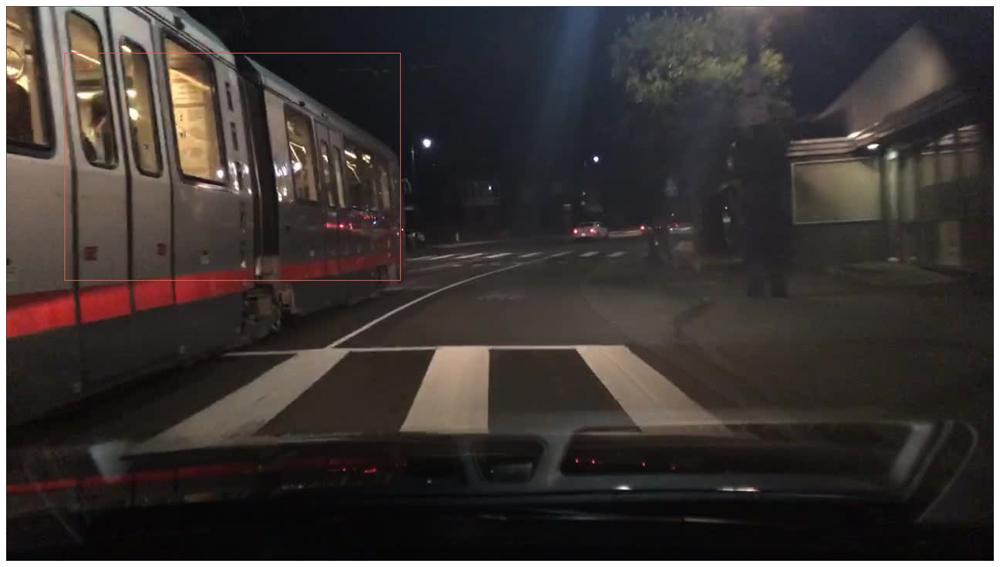

0 1


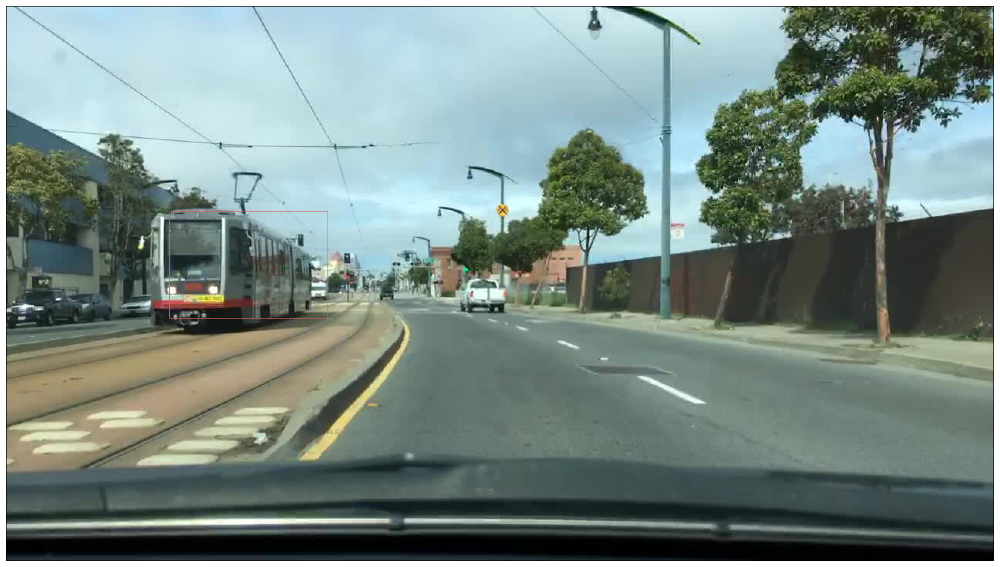

2 0


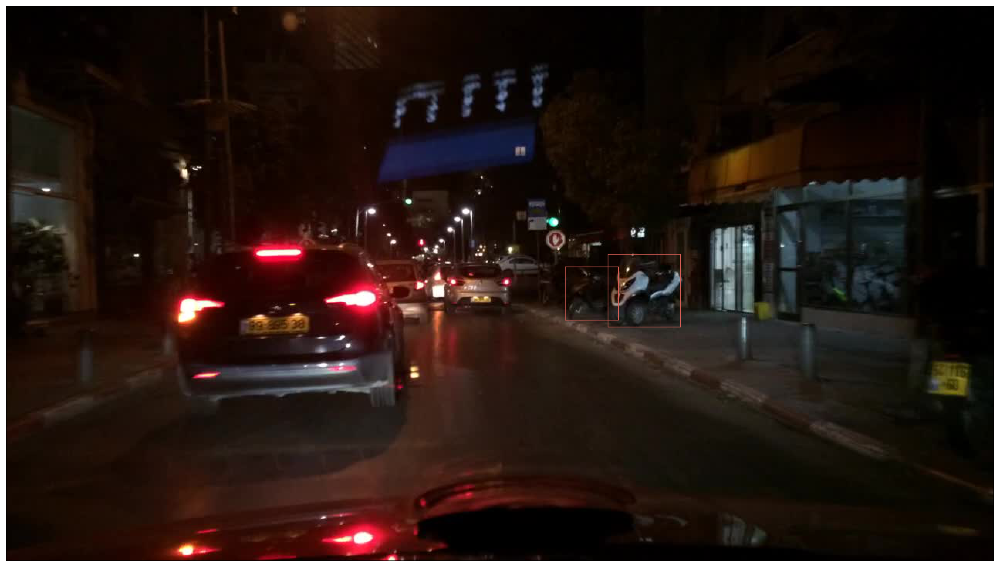

2 1


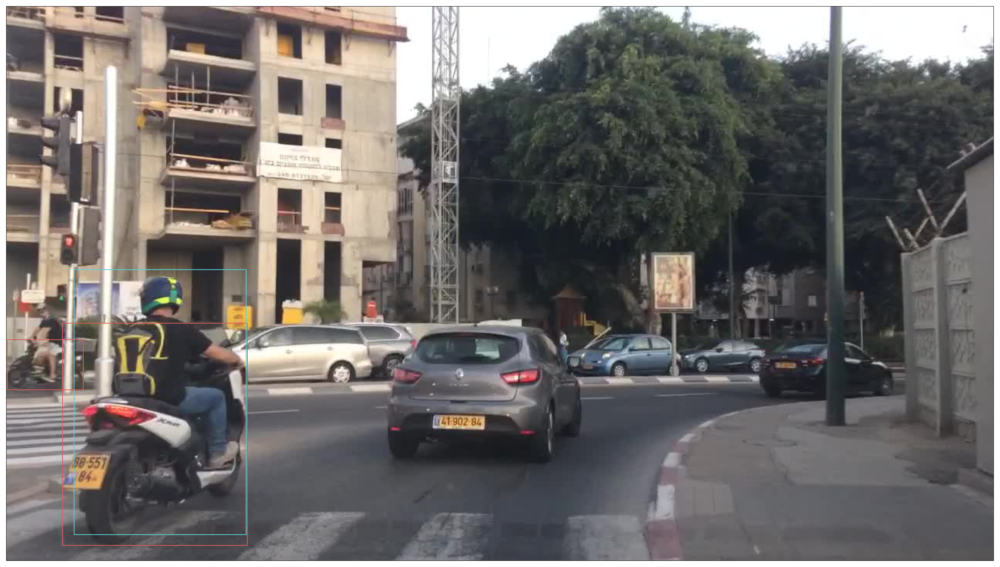

0 2


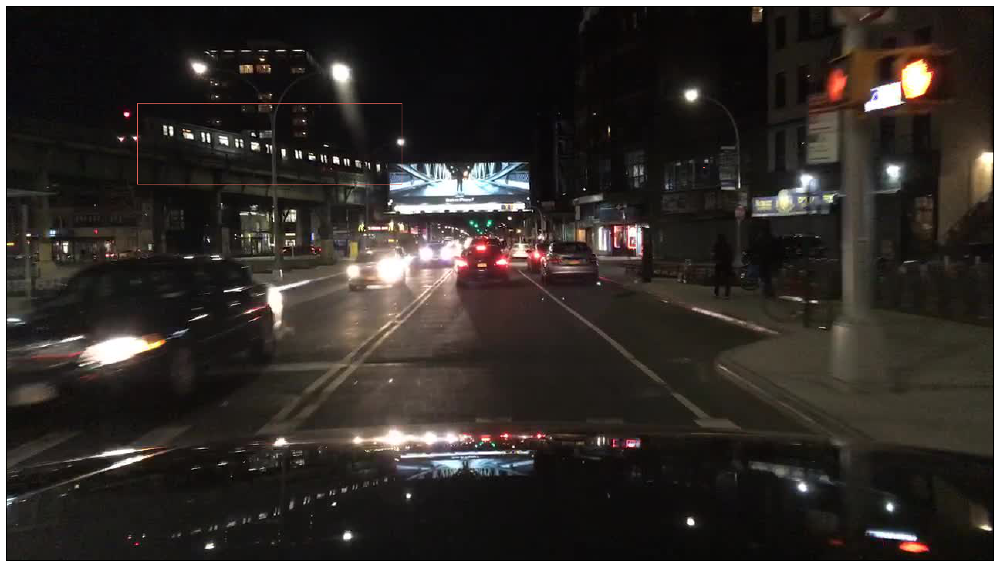

0 1


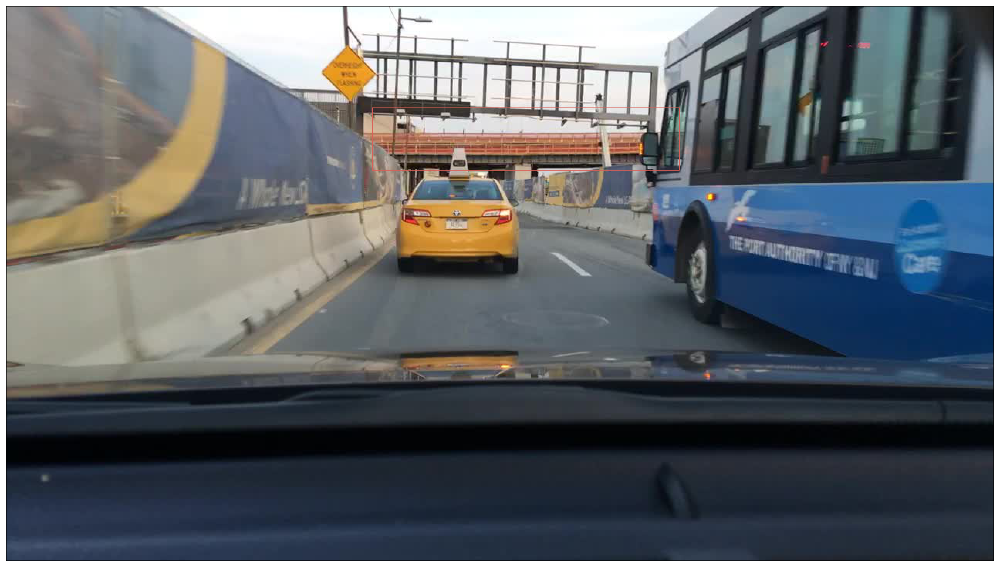

0 1


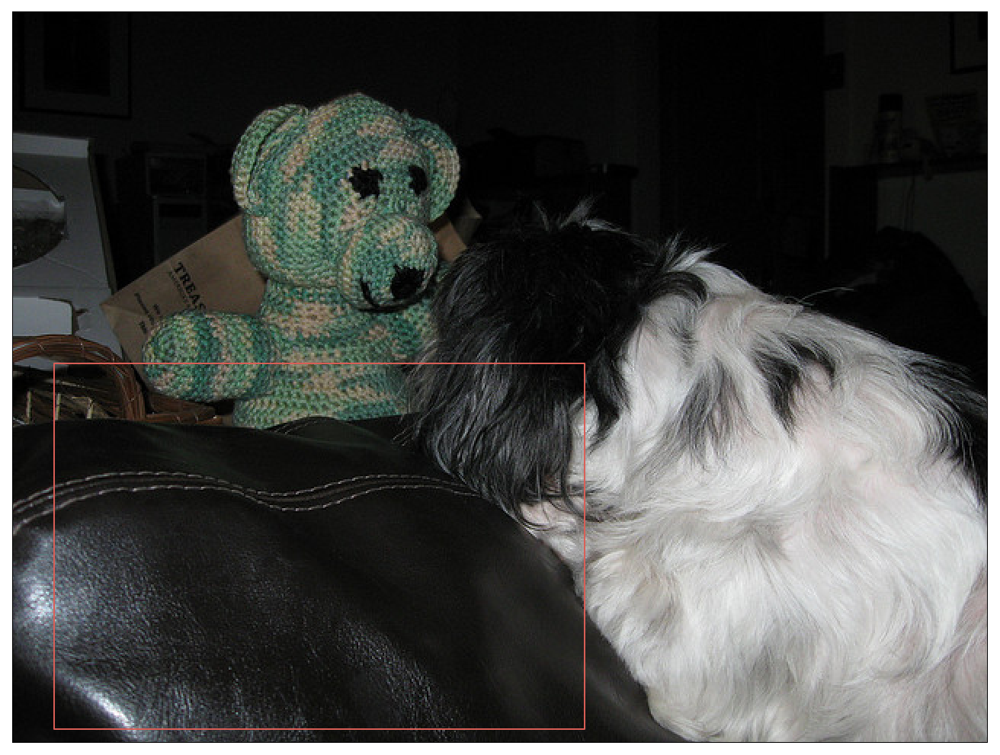

2 1


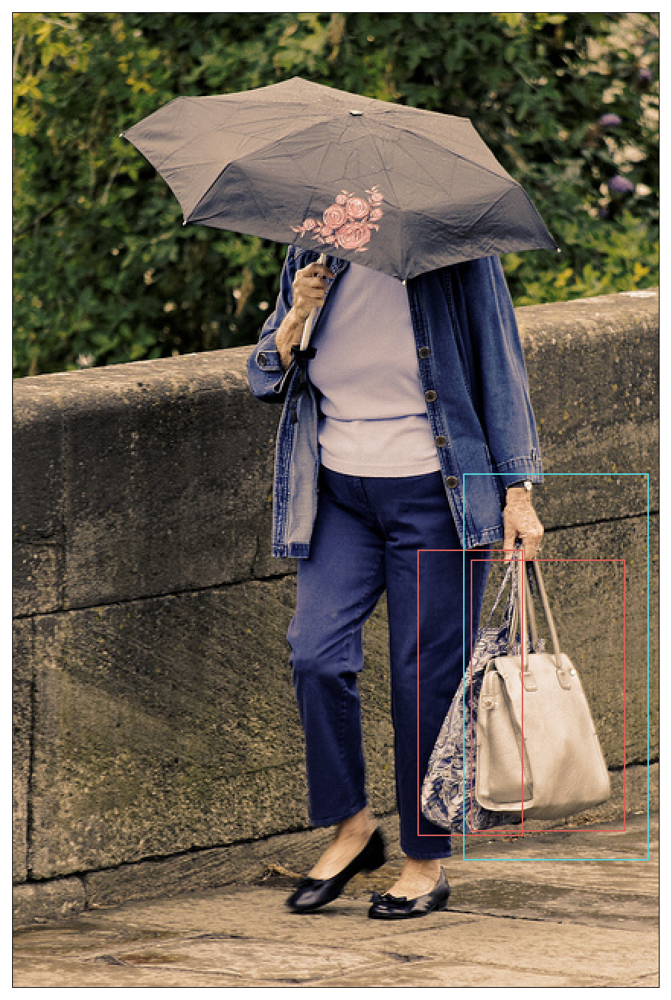

1 0


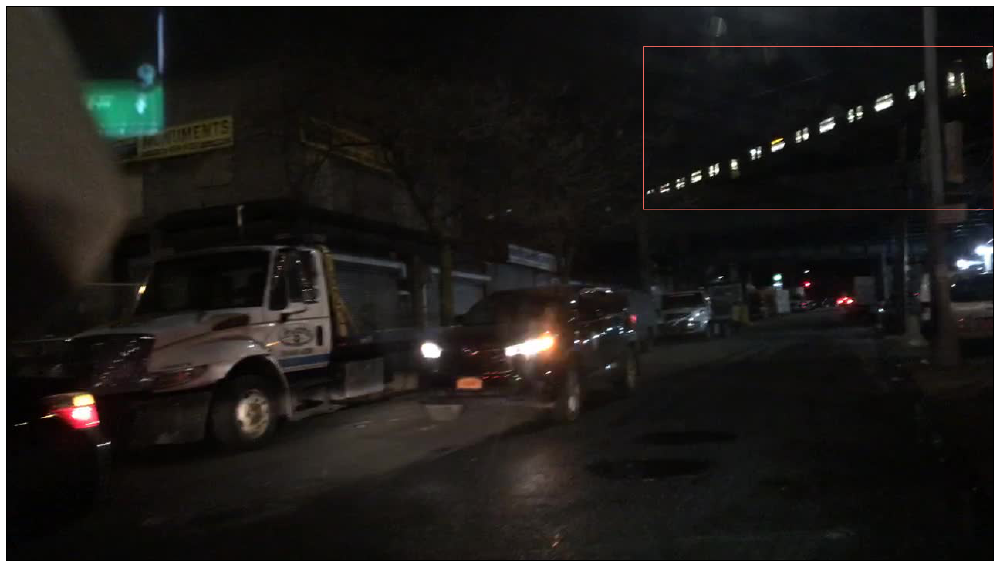

1 0


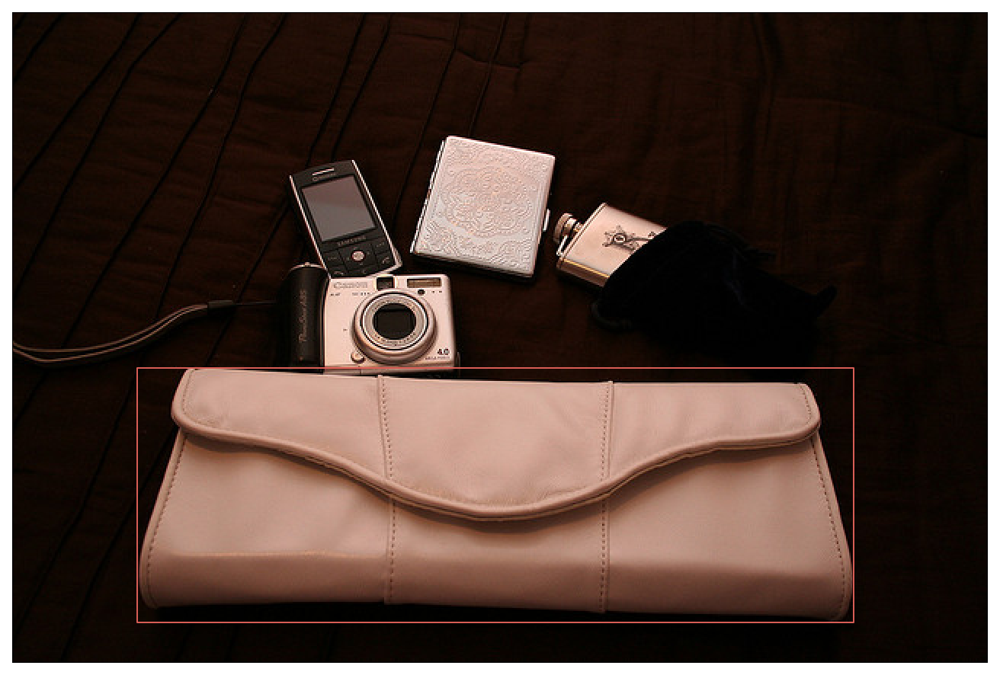

0 1


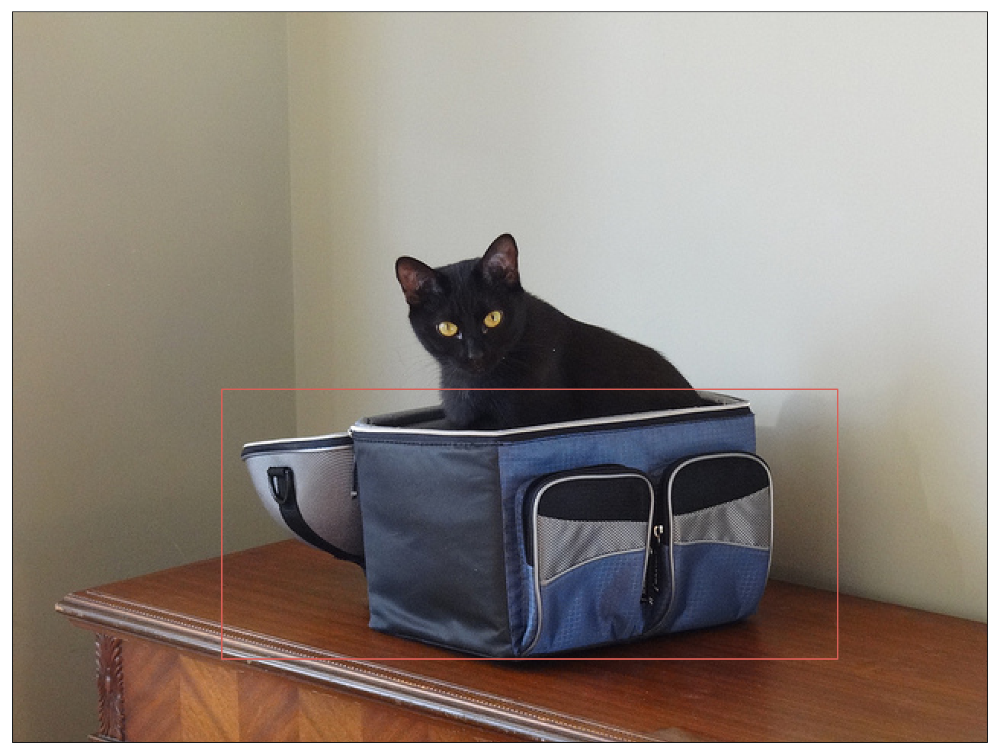

7 3


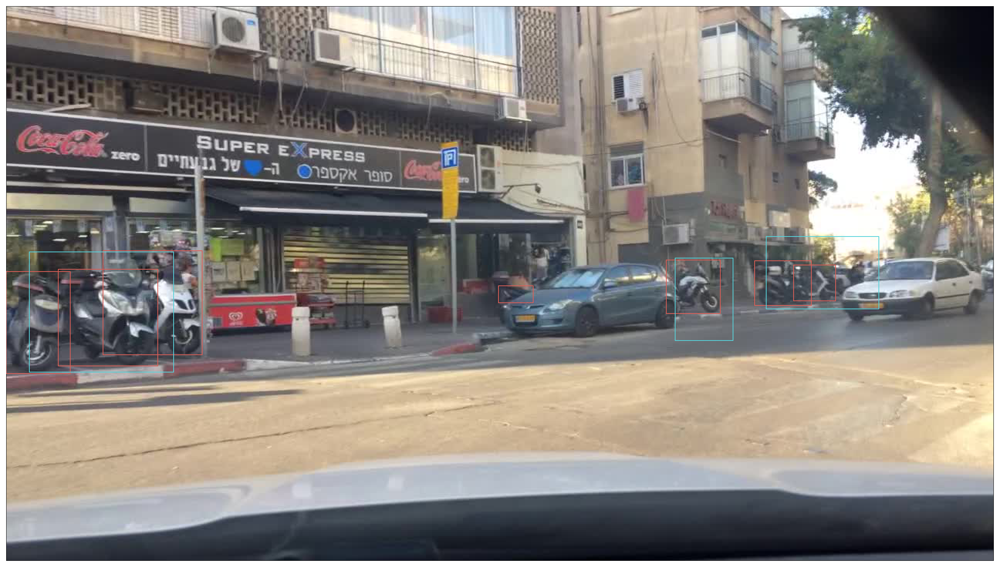

1 2


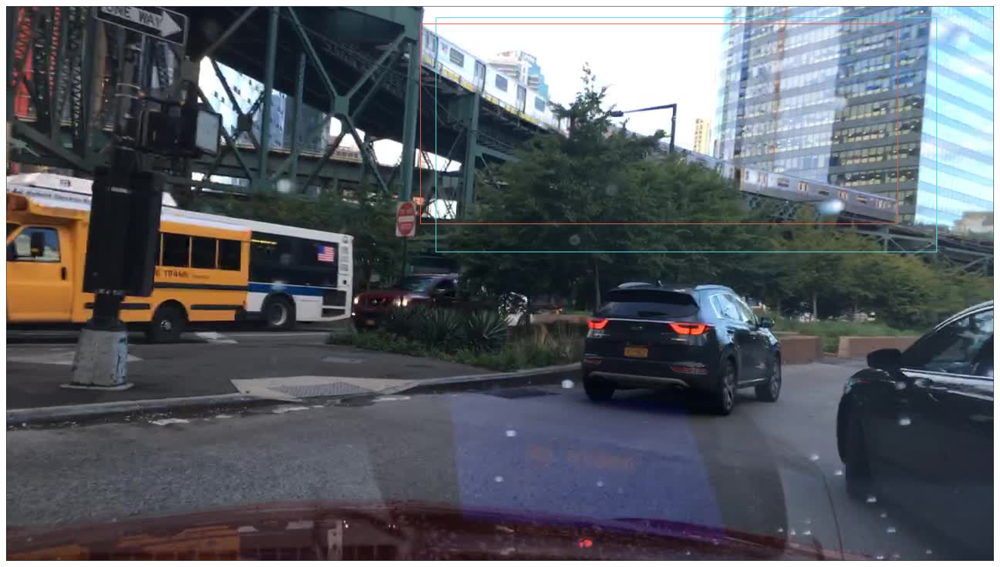

1 0


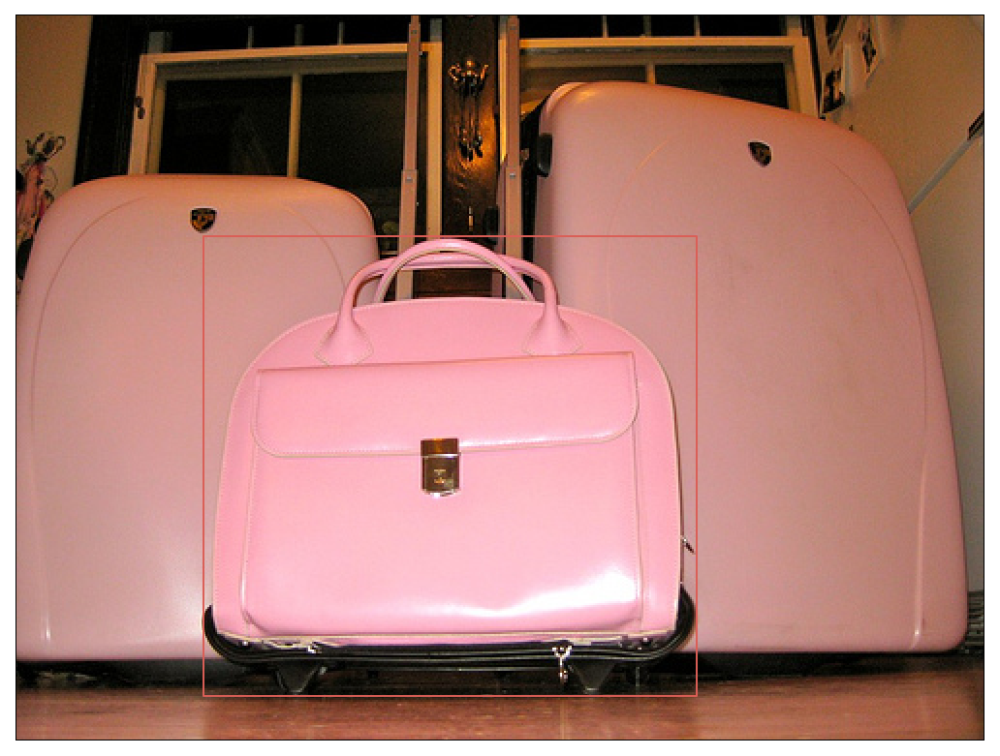

2 1


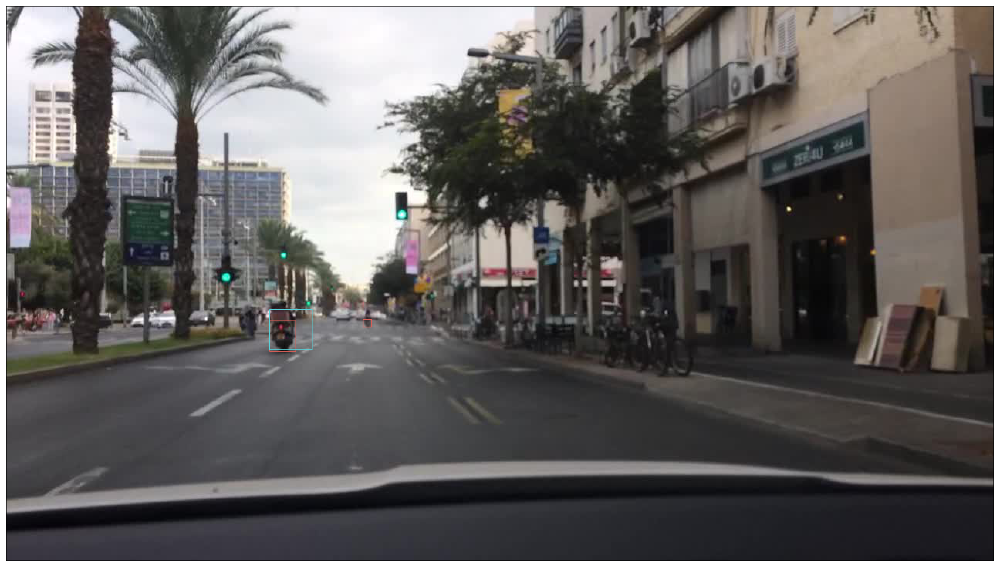

0 1


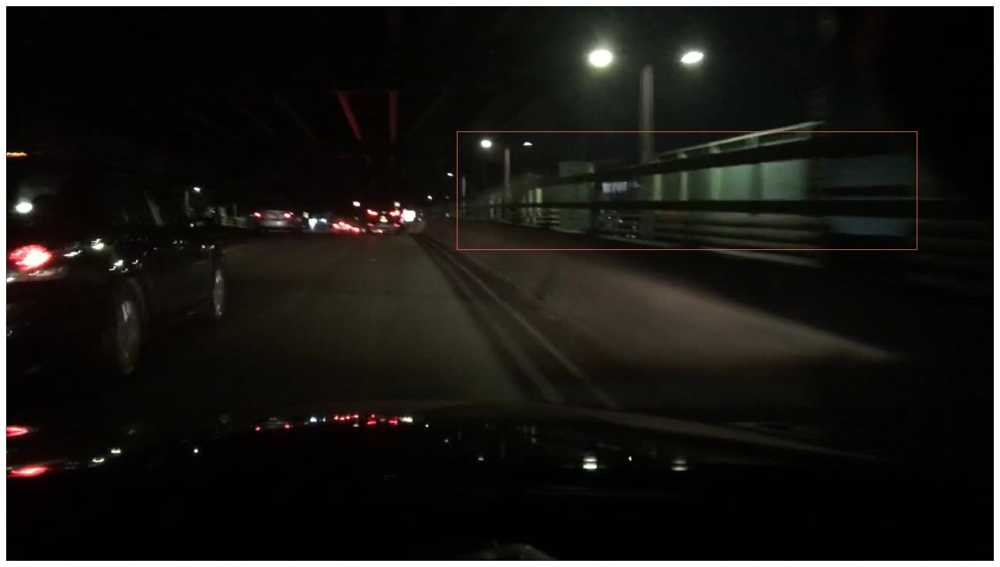

1 2


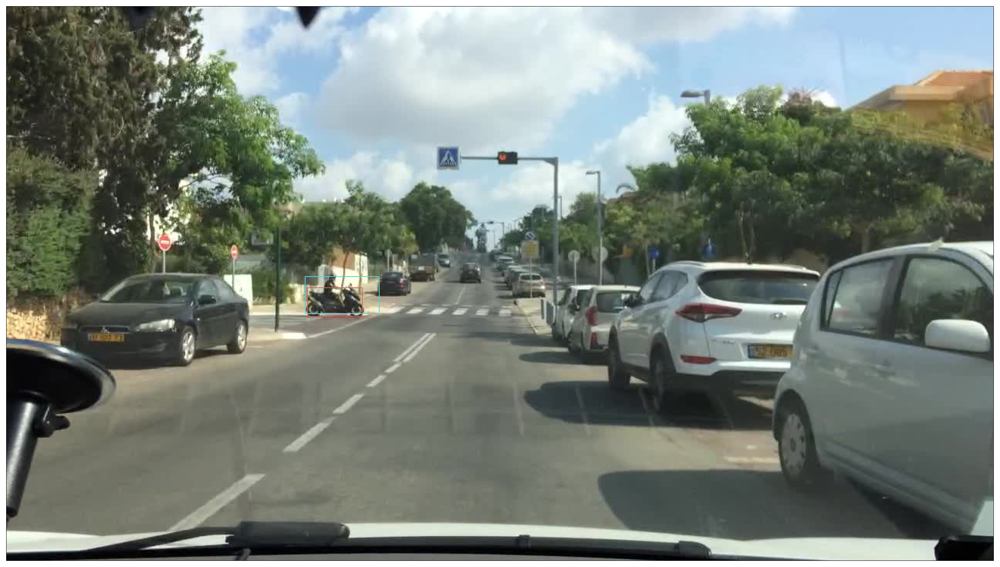

3 1


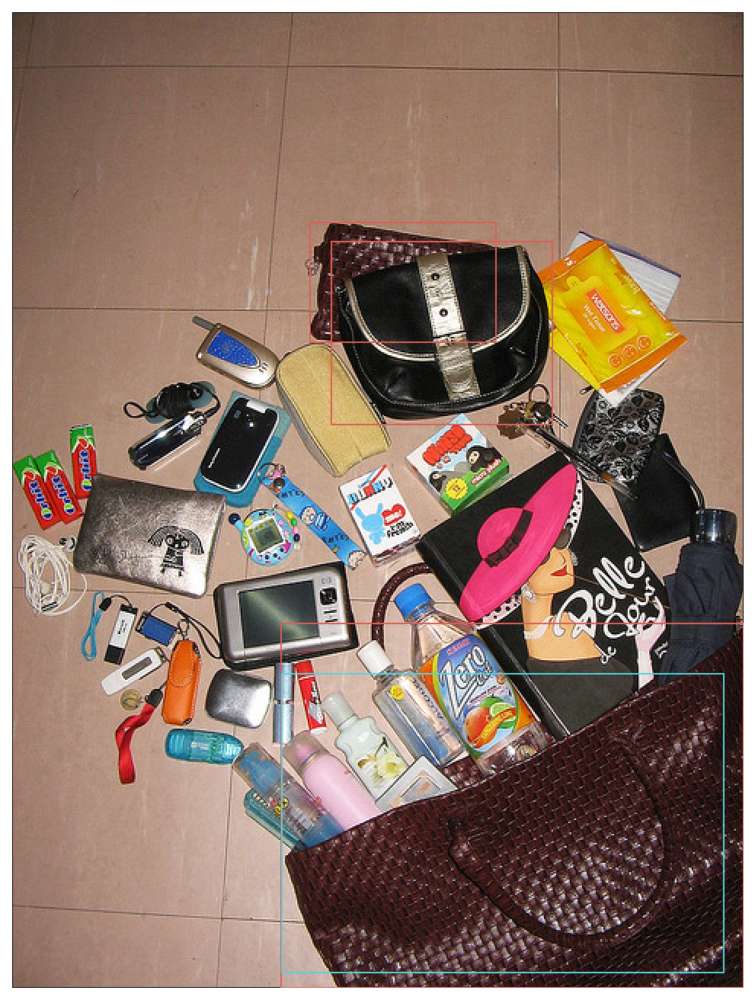

1 0


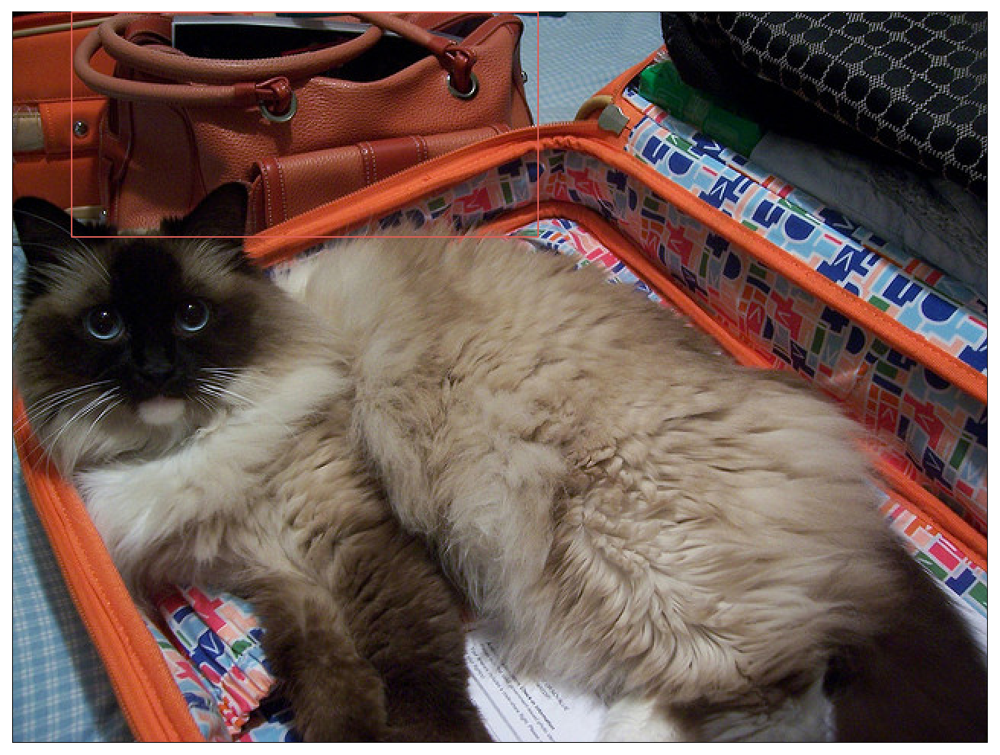

0 1


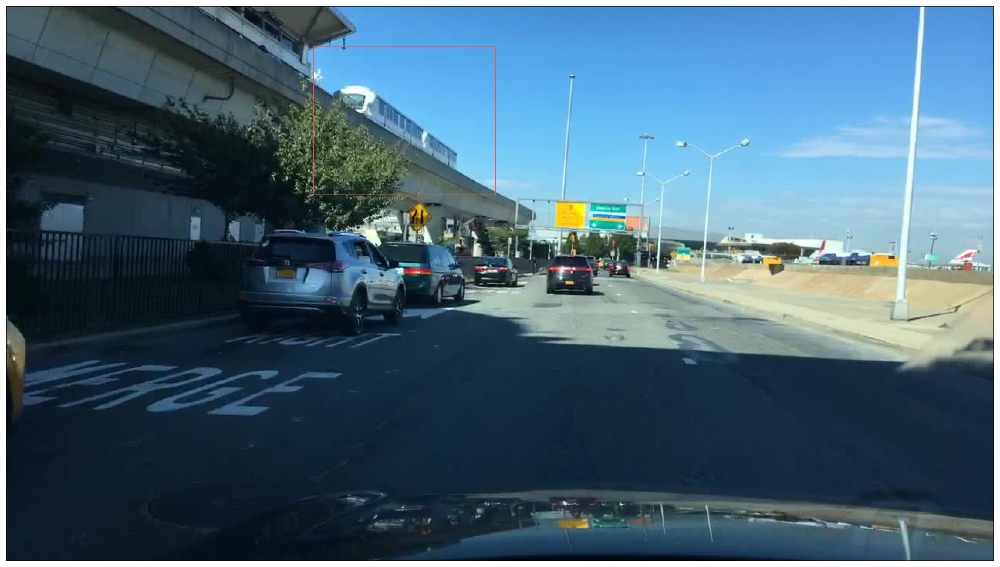

In [354]:
for i,dbidx in enumerate(mismatch.dbidx):
    ev = evs2[mismatch.dataset.iloc[i]]
    box = ev.box_data
    
    im = ev.image_dataset[dbidx]['image']
    ref_boxes = box[(box.dbidx == dbidx) & (box['category'] == category_map[mismatch['query'].iloc[i]])]
    
    ub = user_boxes[(user_boxes.dbidx == dbidx) & (user_boxes.user == mismatch.user.iloc[i])]
    
    print(ref_boxes.shape[0], ub.shape[0])
    all_b = pd.concat([ref_boxes.assign(who='ref'), ub.assign(who='user')], ignore_index=True)
    plt = (ggimg(image=im, data=all_b) 
             + geom_rect(aes(xmin='x1', xmax='x2', ymin='y1', ymax='y2', color='who'), fill=None))
    display(draw_ggimg(plt))

In [286]:
box_summary = box_summary.assign(rel=(box_summary.user_boxes - box_summary.ref_boxes))

In [234]:
by_person = box_summary.groupby(['user','dataset','query'])[['user_boxes', 'ref_boxes', 'rel']].sum().reset_index()

In [246]:
label_df = by_person.groupby(['query'])[['user_boxes', 'ref_boxes', 'rel']].mean()

In [263]:
label_df2 = label_df.assign(rel=label_df.rel/label_df.ref_boxes)
#.groupby('query').mean()

In [264]:
user_study_summary = pd.concat([query_time_summary.sort_index(), label_df2.sort_index()], axis=1)

In [270]:
#dsnames = user_study_summary.index.map(lambda x : {'handbag':'coco', 'motorcycle':'bdd', 'train':'bdd'}[x]).values
table_data = user_study_summary.assign(total_time=user_study_summary.total_time/60)
table_data = table_data.assign(total_images=table_data.total_images.round(0))
table_data = table_data.reset_index()
table_data = table_data.set_index(['query'])

In [272]:
def show_table(tot_res, header=None):
    fmtter = remove_leading_zeros('{:.02f}'.format)
    with pd.option_context('display.float_format', fmtter):
        display(tot_res)
        print(tot_res.to_latex(float_format=fmtter, header=header))

In [273]:
show_table(table_data,header=['user', 'system', 'total (m)', 'images', 'user', 'ref.', 'rel'])

,user_time,system_time,total_time,total_images,user_boxes,ref_boxes,rel
query,,,,,,,
handbag,25.96,.29,3.89,31,29.5,35,-0.16
motorcycle,22.09,.41,3.55,33,38,50.5,-0.25
train,17.61,.39,3.58,40,16,12,.33


\begin{tabular}{lrrrrrrr}
\toprule
{} &  user & system & total (m) & images & user & ref. &   rel \\
query      &       &        &           &        &      &      &       \\
\midrule
handbag    & 25.96 &    .29 &      3.89 &     31 & 29.5 &   35 & -0.16 \\
motorcycle & 22.09 &    .41 &      3.55 &     33 &   38 & 50.5 & -0.25 \\
train      & 17.61 &    .39 &      3.58 &     40 &   16 &   12 &   .33 \\
\bottomrule
\end{tabular}



In [261]:
from seesaw.figures import *

In [262]:
# refboxes

In [15]:
user_df = pd.concat(dfs)

In [16]:
user_df.groupby('query').total.mean()

query
handbag       23.257718
motorcycle    19.963007
train         14.963745
Name: total, dtype: float64

In [14]:
#pickle.load(open(data[0][-1], 'rb'))

In [10]:
pickle.load(open('/home/gridsan/omoll/seesaw/scripts/session_summary_20211107-153134.pkl', 'rb'))

{'qstr': 'handbag',
 'ldata_db': {14363: [{'x1': 141.0,
    'y1': 16.99999999999999,
    'x2': 471.0,
    'y2': 345.0,
    'category': None}]},
 'dataset': 'coco',
 'indices': [array([14363, 76242, 31430]), array([68951, 10055, 27308])],
 'timing': [{'oper': 'text',
   'start': 1636317082.2316039,
   'processing': 0.2178800106048584},
  {'oper': 'next',
   'start': 1636317090.6722124,
   'processing': 0.25191307067871094}]}